##Imports
ref : https://colab.research.google.com/github/luxonis/depthai-ml-training/blob/master/colab-notebooks/YoloV3_V4_tiny_training.ipynb#scrollTo=fwRcypwSxdnw

In [ ]:
import pandas as pd
%tensorflow_version 1.x
import tensorflow as tf #choosing tensorflow version
tf.__version__
from shutil import copyfile
import os
import shutil
from google.colab import drive
import re
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow
import cv2
import inspect
import random
import sys

After that, `%tensorflow_version 1.x` will throw an error.

Your notebook should be updated to use Tensorflow 2.
See the guide at https://www.tensorflow.org/guide/migrate#migrate-from-tensorflow-1x-to-tensorflow-2.

TensorFlow 1.x selected.


In [ ]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


Utilities:

In [ ]:

def extract_log(log_file,new_log_file,key_word):
    with open(log_file, 'r') as f:
      with open(new_log_file, 'w') as train_log:
  #f = open(log_file)
    #train_log = open(new_log_file, 'w')
        for line in f:
          if 'Syncing' in line:
            continue
          if 'nan' in line:
            continue
          if 'Region 82 Avg' in line:
            continue
          if 'Region 94 Avg' in line:
            continue
          if 'Region 106 Avg' in line:
            continue
          if 'total_bbox' in line:
            continue  
          if 'Loaded' in line:
            continue              
          if key_word in line:
            train_log.write(line)
    f.close()
    train_log.close()

def extract_log2(log_file,new_log_file,key_word):
    with open(log_file, 'r') as f:
      with open(new_log_file, 'w') as train_log:
  #f = open(log_file)
    #train_log = open(new_log_file, 'w')
        for line in f:
          if 'Syncing' in line:
            continue
          if 'nan' in line:
            continue
          if 'Region 94 Avg' in line:
            continue
          if 'Region 106 Avg' in line:
            continue
          if 'total_bbox' in line:
            continue  
          if 'Loaded' in line:
            continue     
          if 'IoU: 0.000000' in line:
            continue                          
          if key_word in line:
            del_num=line.replace("v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 82 Avg (", "")
            train_log.write(del_num.replace(")", ""))
          
    f.close()
    train_log.close() 

In [ ]:
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)
  
# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

## 1. Mount the drive

In [ ]:
drive.mount('/gdrive')
%cd /gdrive

In [ ]:
%cd MyDrive/Dataset_fire_detection

In [ ]:
%ls

MyDrive/  Shareddrives/


##2. Setting up Darknet

In [ ]:
%%capture
!git clone https://github.com/AlexeyAB/darknet.git

In [ ]:
%cd darknet

In [ ]:

!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!make


sed: can't read Makefile: No such file or directory
sed: can't read Makefile: No such file or directory
sed: can't read Makefile: No such file or directory
sed: can't read Makefile: No such file or directory
make: *** No targets specified and no makefile found.  Stop.


In [ ]:
# verify CUDA
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [ ]:
!chmod +x ./darknet

In [ ]:
%ls

 3rdparty/                core                     LICENSE
 anchors.txt              counters_per_class.txt   Makefile
 backup/                  darknet*                 net_cam_v3.sh
 bad.list                 DarknetConfig.cmake.in   net_cam_v4.sh
 build/                   darknet_images.py        obj/
 build.ps1                darknet.py               README.md
 cfg/                     darknet_video.py         results/
 chart.png                data/                    scripts/
 chart_yolov3-tiny.png    image_yolov3.sh          src/
 cmake/                   image_yolov4.sh          vcpkg.json
 CMakeLists.txt           include/                 video_yolov3.sh
'Copie de train V2.log'   json_mjpeg_streams.sh    video_yolov4.sh


## Dataset

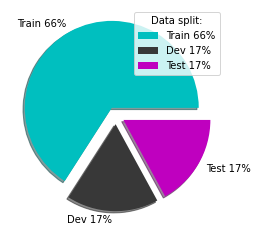

In [ ]:
y = np.array([723, 187, 187])
mylabels = ["Train 66%", "Dev 17%", "Test 17%"]
myexplode = [0.1, 0.1, 0.1]
mycolors = ["c", "#383838", "m"]
plt.pie(y, labels = mylabels, explode = myexplode, shadow = True,colors=mycolors)
plt.legend(title = "Data split:")
plt.show() 

## 4. Train preparation

### 4.1 Download weights for YoloV4 tiny

In [ ]:
%ls

 annotation/   data/             obj_test.data     yolov3-tiny.conv.15
 backup/       imgs/             README.txt       'yolov3 tiny logs'/
 classes.txt   metadata1.5.csv  'yolov3 logs'/
 darknet/      obj.data          yolov3-tiny.cfg


In [ ]:
!wget https://pjreddie.com/media/files/yolov4-tiny.conv.29

--2022-07-01 13:34:24--  https://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M  37.1MB/s    in 4.7s    

2022-07-01 13:34:29 (32.9 MB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



In [ ]:
labels = ['fire']

In [ ]:
#the number of classes is equal to the number of labels
num_classes = len(labels)


### 4.2 Config file

In [ ]:
%cd darknet

/gdrive/.shortcut-targets-by-id/1SZqBv7YUp5ORgNfzSae7rSC3Y7kMeWfQ/Dataset_fire_detection/darknet


In [ ]:
!cp '/gdrive/MyDrive/Dataset_fire_detection/darknet/cfg/yolov4-tiny.cfg' '/gdrive/MyDrive/Dataset_fire_detection/cfg_files/yolov4-tiny.cfg'

In [ ]:
cfg_file = f'/gdrive/MyDrive/Dataset_fire_detection/cfg_files/yolov4-tiny.cfg'
cfg_file

'/gdrive/MyDrive/Dataset_fire_detection/cfg_files/yolov4-tiny.cfg'

In [ ]:
weights_file = '/gdrive/MyDrive/Dataset_fire_detection/weights/yolov4-tiny.conv.29'
weights_file

'/gdrive/MyDrive/Dataset_fire_detection/weights/yolov4-tiny.conv.29'

#### 4.4.1 Setting parameters

You can set a custom height and width, as long as they are both divisible by *32*.

**Other parameters**

We set other parameters according to [this tutorial](https://github.com/AlexeyAB/darknet#how-to-train-to-detect-your-custom-objects).

In [ ]:
labels = ['fire']
num_classes = len(labels)

In [ ]:
# must be divisible by 32
yolo_height = 320
yolo_width = 512

# set the number of max_batches - min 2000 per class:
max_batch = num_classes * 2500
# calculate the 2 steps values:
step1 = 0.8 * max_batch
step2 = 0.9 * max_batch

# we also need to adjust the number of classes and a parameter called filter size 
# that are both is inside the model structure

# num_classes = len(labels)
num_filters = (num_classes + 5) * 3

batch = 64
subdivisions = 16 #4 images per iteration how many iterations ? plot the epochs
burn_in = 100
#learning_rate = 0.001


In [ ]:
num_filters

18

#### 4.4.2 parameters
It's how many mini batches you split your batch in.  
`Batch=64 -> loading 64 images for this "iteration"`.
`Subdivision=8 -> Split batch into 8 "mini-batches"`   
So 64/8 = 8 images per "minibatch" and this get sent to the gpu for process.
That will be repeated 8 times until the batch is completed and a new itereation will start with 64 new images.

*When batching you are averaging over more images the intend is not only to speed up the training process but also to generalise the training more.* -The more you know 🧠

If your GPU have enough memory you can reduce the subdivision to load more images into the gpu to process at the same time.  
Total of images in train set :  723 images 
CL :  
dataset = 723 samples = 1 epoch  
batch = 64  
subdivisions = mini-batches = 16  
1 epoch = 12 iterations = 723/64  
1 iteration = 16 mini-batches = 1 batch  
mini-batch size = 64/16 = 4 samples  

In [ ]:
%ls

 3rdparty/                core                     Makefile
 anchors.txt              counters_per_class.txt   net_cam_v3.sh
 backup/                  darknet*                 net_cam_v4.sh
 bad.list                 DarknetConfig.cmake.in   obj/
 build/                   darknet_images.py        README.md
 build.ps1                darknet.py               results/
 cfg/                     darknet_video.py         scripts/
 chart.png                data/                    src/
 chart_yolov3.png         image_yolov3.sh          train.log
 chart_yolov3-tiny.png    image_yolov4.sh          vcpkg.json
 cmake/                   include/                 video_yolov3.sh
 CMakeLists.txt           json_mjpeg_streams.sh    video_yolov4.sh
'Copie de train V2.log'   LICENSE


In [ ]:
with open(cfg_file) as f:
    s = f.read()
# (re.sub('[a-z]*@', 'ABC@', s))
s = re.sub('max_batches = \d*','max_batches = '+str(max_batch),s)
#s = re.sub('steps=\d*,\d*','steps='+"{:.0f}".format(step1)+','+"{:.0f}".format(step2),s)
#s = re.sub('classes=\d*','classes='+str(num_classes),s)
#s = re.sub('pad=1\nfilters=\d*','pad=1\nfilters='+"{:.0f}".format(num_filters),s)
#s = re.sub('batch=\d*', 'batch='+str(batch), s)
#s = re.sub('subdivisions=\d*', 'subdivisions='+str(subdivisions), s)
s = re.sub('height=\d*', 'height='+str(yolo_height), s)
s = re.sub('width=\d*', 'width='+str(yolo_width), s)
s = re.sub('burn_in=\d*', 'burn_in='+str(burn_in), s)
# s = re.sub('learning_rate=\d*','learning_rate='+str(learning_rate),s)
# pad=1\nfilters=\d\d
# s = re.sub('CUDNN=0','CUDNN=1',s)
# s = re.sub('OPENCV=0','OPENCV=1',s)

with open(cfg_file, 'w') as f:
  # s = re.sub('GPU=0','GPU=1',s)
  f.write(s)



We inspect the config file and check whether the parameters were set correctly.


In [ ]:
!head -n 24 $cfg_file

[net]
# Testing
#batch=64
#subdivisions=16
# Training
batch=64
subdivisions=16
width=512
height=320
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.00075
burn_in=100

max_batches = 2500
policy=steps
steps=2400,2700
scales=.1,.1


We also inspect the last few lines to see if the number of filters in [convolutional] before [yolo] is correct.

In [ ]:
!cat  '/gdrive/MyDrive/Dataset_fire_detection/cfg_files/yolov4-tiny.cfg'

[net]
# Testing
#batch=64
#subdivisions=16
# Training
batch=64
subdivisions=16
width=512
height=320
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.001
burn_in=500

max_batches = 3000
policy=steps
steps=2400,2700
scales=.1,.1


#weights_reject_freq=1001
#ema_alpha=0.9998
#equidistant_point=1000
#num_sigmas_reject_badlabels=3
#badlabels_rejection_percentage=0.2


[convolutional]
batch_normalize=1
filters=32
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=leaky

[route]
layers=-1
groups=2
group_id=1

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=leaky

[route]
layers = -1,-2

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=leaky

[route]
l

### V1
[net]
batch=64
subdivisions=16
width=480
height=320
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.00075
burn_in=500

max_batches = 2000
policy=steps
steps=2400,2700
scales=.1,.1

#### Training time

We set up all the things that we need for training.

As we are training with -map flag, we will get the best weights saved in backup/ directory with suffix best. Those will be the weights that give the highest mAP on the validation set, in order to prevent overfitting.



In [ ]:
!./darknet detector train '/gdrive/MyDrive/Dataset_fire_detection/obj.data' $cfg_file $weights_file -dont_show -map | tee train.log 2>&1

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.721442), count: 6, class_loss = 1.269926, iou_loss = 0.280112, total_loss = 1.550038 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.849635), count: 3, class_loss = 0.429381, iou_loss = 1.347123, total_loss = 1.776504 
 total_bbox = 206718, rewritten_bbox = 0.008708 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.683881), count: 3, class_loss = 0.347770, iou_loss = 0.289325, total_loss = 0.637094 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.697651), count: 4, class_loss = 0.392602, iou_loss = 0.949222, total_loss = 1.341824 
 total_bbox = 206725, rewritten_bbox = 0.008707 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.712556), count: 5, class_loss = 0.634553, iou_loss = 0.216876, tot

train for another 1000 iterations:

In [ ]:
!./darknet detector train '/gdrive/MyDrive/Dataset_fire_detection/obj.data' $cfg_file '/gdrive/MyDrive/Dataset_fire_detection/yolov4 tiny logs/v1/yolov4-tiny_last.weights' -dont_show -map | tee trainTV4.log 2>&1

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.781167), count: 4, class_loss = 0.320855, iou_loss = 0.460236, total_loss = 0.781091 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.719966), count: 2, class_loss = 0.565378, iou_loss = 0.908416, total_loss = 1.473794 
 total_bbox = 98790, rewritten_bbox = 0.009110 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.727374), count: 2, class_loss = 0.298258, iou_loss = 0.070355, total_loss = 0.368612 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.613900), count: 1, class_loss = 0.228582, iou_loss = 0.807060, total_loss = 1.035642 
 total_bbox = 98793, rewritten_bbox = 0.009110 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.759611), count: 5, class_loss = 0.718950, iou_loss = 0.368855, total

In [ ]:
!./darknet detector train '/gdrive/MyDrive/Dataset_fire_detection/obj.data' $cfg_file $weights_file -dont_show -map | tee trainTV4V2.log 2>&1

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.745643), count: 4, class_loss = 0.319139, iou_loss = 0.114036, total_loss = 0.433175 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.627592), count: 1, class_loss = 0.313772, iou_loss = 1.111199, total_loss = 1.424971 
 total_bbox = 206257, rewritten_bbox = 0.007272 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.814570), count: 2, class_loss = 0.216757, iou_loss = 0.216798, total_loss = 0.433554 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.690576), count: 8, class_loss = 0.374636, iou_loss = 8.342203, total_loss = 8.716840 
 total_bbox = 206267, rewritten_bbox = 0.007272 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.776827), count: 4, class_loss = 0.794150, iou_loss = 0.218117, tot

#### Loss




In [ ]:
p_dir = '/gdrive/MyDrive/Dataset_fire_detection/yolov4 tiny logs/v1'
log_file = p_dir + '/traintinyYv4.log'
dst_map = p_dir + '/map.txt'
dst_loss = p_dir +'/train_log_loss.txt'
path_loss = p_dir + '/train_log_loss.csv'
path_map = p_dir + '/map.csv'
# Extract logs
#extract_log(log_file ,dst_loss,'images')
#extract_log(log_file,dst_map,'mean average precision ')
# extract_log2(p_dir + '/trainY_v3_2500bat_burnin_1000.log',p_dir + '/train_log_iou.txt','IoU')

In [ ]:
# reformat logs
with open (dst_loss, "r") as myfile:
    data = myfile.read().splitlines()
data = data[1::]
a = [line.split(',') for line in data]

In [ ]:
loss =[]
avg_l = []
rate = []
time = []
images = []
h_left = []
df = {'loss':loss,'avg loss':avg_l,'rate':rate,'time':time,'images':images,'hours_left':h_left}
for line in a : 
  n_line = []
  for ele,key in zip(line,df.keys()):
    if line.index(ele) == 0:
      df[key].append(ele.split(':')[1])
    else:
      df[key].append(ele.split()[0])

pd.DataFrame.from_dict(df).to_csv(path_loss,index = False)

In [ ]:
with open (dst_map, "r") as myfile:
    map = myfile.read().splitlines()

map = [line.split()[-2] for line in map]
print(map)

['15.58', '27.40', '33.58', '40.70', '46.16', '45.29', '51.41', '52.80', '52.57', '54.80', '56.05', '55.83', '58.39', '58.80', '57.11', '58.54']


In [ ]:
z = pd.DataFrame.from_dict({'mAP':map})
z.to_csv(path_map,index=False)

In [ ]:
z = pd.read_csv(path_loss)
t_l = list(z['loss'])
a_l = list(z['avg loss'])
v_l=[]
v_l = [2*float(a)-float(t) for t, a in zip(t_l,a_l)]
z['valid loss']=v_l
z.to_csv(path_loss,index=False)

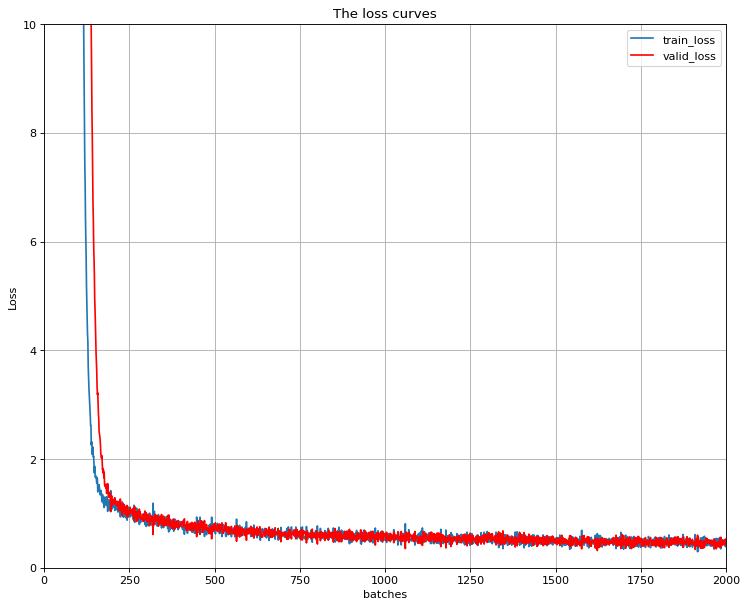

In [ ]:
#map the training loss and valid loss
df1 = pd.read_csv(path_loss)
m = list(df1['valid loss'])
m_prime = list(df1['loss'])
 
fig = plt.figure(figsize=(11, 9), dpi=80)
ax = fig.add_subplot(1, 1, 1)
plt.plot(m_prime, label = 'train_loss')
plt.plot(m, label = 'valid_loss',color='red') # bar can be replaced by
plt.ylim(0.0,10.00) 
plt.xlim(0,2000)
ax.set_title('The loss curves')
ax.set_ylabel('Loss')
ax.set_xlabel('batches')

plt.legend(loc='best')
# scatter or line or even left as default
plt.grid()
plt.show()

#### mAP

In [ ]:
df2 = pd.read_csv(path_map)
x = [i for i in range(500, 2000+1, 100)]
y = list(df2['mAP'])
print(x,y)
len(y)

[500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000] [15.58, 27.4, 33.58, 40.7, 46.16, 45.29, 51.41, 52.8, 52.57, 54.8, 56.05, 55.83, 58.39, 58.8, 57.11, 58.54]


16

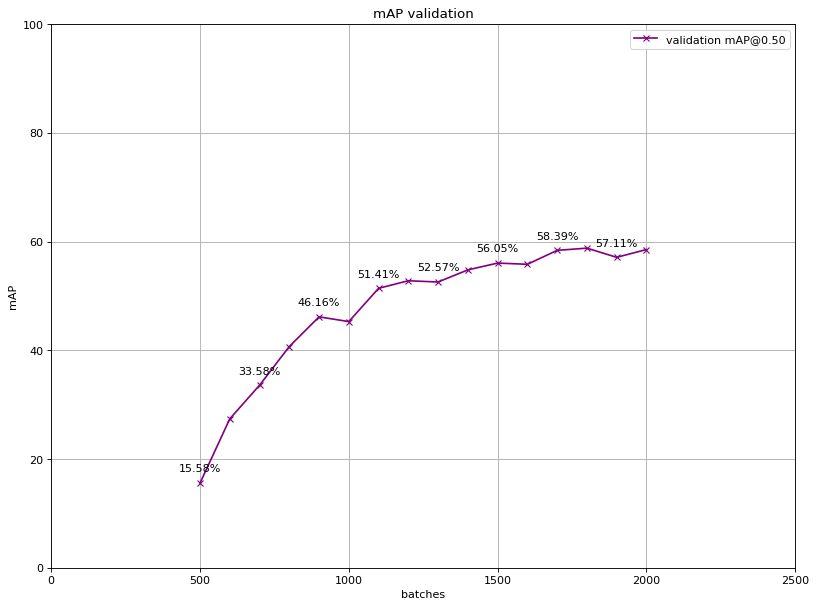

In [ ]:

fig = plt.figure(figsize=(12, 9), dpi=80)
ax = fig.add_subplot(1, 1, 1)
plt.plot(x,y, label = 'validation mAP@0.50',color ='purple',marker='x') # bar can be replaced by
plt.ylim(0.0,100.00) 
plt.xlim(0,2500)
ax.set_title('mAP validation')
ax.set_ylabel('mAP')
ax.set_xlabel('batches')
plt.legend(loc='best')
a = x[::2]
b = y[::2]
for i,j in zip(a,b):

    label = "{:.2f}".format(j)

    plt.annotate(label+'%', # this is the text
                 (i,j), # these are the coordinates to position the label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center')
plt.grid()
# scatter or line or even left as default
plt.show()

### V2  
[net]
batch=64
subdivisions=16
width=512
height=320
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.00075
burn_in=100

max_batches = 2500
policy=steps
steps=2400,2700
scales=.1,.1

In [ ]:
!./darknet detector train '/gdrive/MyDrive/Dataset_fire_detection/obj.data' $cfg_file $weights_file -dont_show -map | tee trainTinyYolov4_f.log 2>&1

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.793366), count: 2, class_loss = 0.118861, iou_loss = 0.250354, total_loss = 0.369215 
 total_bbox = 260924, rewritten_bbox = 0.004982 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.706925), count: 3, class_loss = 0.656933, iou_loss = 0.222028, total_loss = 0.878961 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.755272), count: 2, class_loss = 0.555896, iou_loss = 0.545997, total_loss = 1.101893 
 total_bbox = 260929, rewritten_bbox = 0.004982 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 30 Avg (IOU: 0.799600), count: 4, class_loss = 0.301937, iou_loss = 0.340400, total_loss = 0.642337 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 37 Avg (IOU: 0.695465), count: 3, class_loss = 0.135327, iou_loss = 1.248721, tot

#### Loss

In [ ]:
p_dir = '/gdrive/MyDrive/Dataset_fire_detection/yolov4_tiny_logs/v2'
log_file = p_dir + '/trainTinyYolov4_f.log'
dst_map = p_dir + '/map.txt'
dst_loss = p_dir +'/train_log_loss.txt'
path_loss = p_dir + '/train_log_loss.csv'
path_map = p_dir + '/map.csv'

In [ ]:

# Extract logs
extract_log(log_file ,dst_loss,'images')
extract_log(log_file,dst_map,'mean average precision ')
# extract_log2(p_dir + '/trainY_v3_2500bat_burnin_1000.log',p_dir + '/train_log_iou.txt','IoU')

In [ ]:
# reformat logs
with open (dst_loss, "r") as myfile:
    data = myfile.read().splitlines()
data = data[1::]
a = [line.split(',') for line in data]

In [ ]:
loss =[]
avg_l = []
rate = []
time = []
images = []
h_left = []
df = {'loss':loss,'avg loss':avg_l,'rate':rate,'time':time,'images':images,'hours_left':h_left}
for line in a : 
  n_line = []
  for ele,key in zip(line,df.keys()):
    if line.index(ele) == 0:
      df[key].append(ele.split(':')[1])
    else:
      df[key].append(ele.split()[0])

pd.DataFrame.from_dict(df).to_csv(path_loss,index = False)

In [ ]:
with open (dst_map, "r") as myfile:
    map = myfile.read().splitlines()

map = [line.split()[-2] for line in map]
print(map)

['7.31', '26.61', '34.45', '34.18', '46.61', '46.01', '47.88', '50.06', '52.19', '55.38', '53.23', '52.99', '50.99', '51.34', '52.64', '55.55', '53.60', '58.48', '59.96', '55.71', '54.30', '56.89', '58.51', '57.59', '59.77']


In [ ]:
z = pd.DataFrame.from_dict({'mAP':map})
z.to_csv(path_map,index=False)

In [ ]:
z = pd.read_csv(path_loss)
t_l = list(z['loss'])
a_l = list(z['avg loss'])
v_l=[]
v_l = [2*float(a)-float(t) for t, a in zip(t_l,a_l)]
z['valid loss']=v_l
z.to_csv(path_loss,index=False)

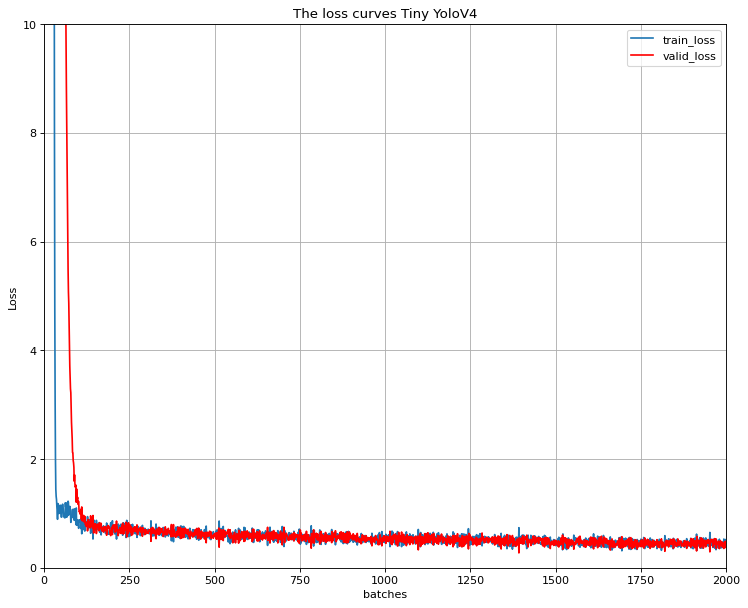

In [ ]:
#map the training loss and valid loss
df1 = pd.read_csv(path_loss)
m = list(df1['valid loss'])
m_prime = list(df1['loss'])
 
fig = plt.figure(figsize=(11, 9), dpi=80)
ax = fig.add_subplot(1, 1, 1)
plt.plot(m_prime, label = 'train_loss')
plt.plot(m, label = 'valid_loss',color='red') # bar can be replaced by
plt.ylim(0.0,10.00) 
plt.xlim(0,2000)
ax.set_title('The loss curves Tiny YoloV4')
ax.set_ylabel('Loss')
ax.set_xlabel('batches')

plt.legend(loc='best')
# scatter or line or even left as default
plt.grid()
plt.savefig('Tiny Yolov4 The loss curves.png')
plt.show()

#### mAP

In [ ]:
df2 = pd.read_csv(path_map)
x = [i for i in range(100, 2500+1, 100)]
y = list(df2['mAP'])
print(x,y)
len(y)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500] [7.31, 26.61, 34.45, 34.18, 46.61, 46.01, 47.88, 50.06, 52.19, 55.38, 53.23, 52.99, 50.99, 51.34, 52.64, 55.55, 53.6, 58.48, 59.96, 55.71, 54.3, 56.89, 58.51, 57.59, 59.77]


25

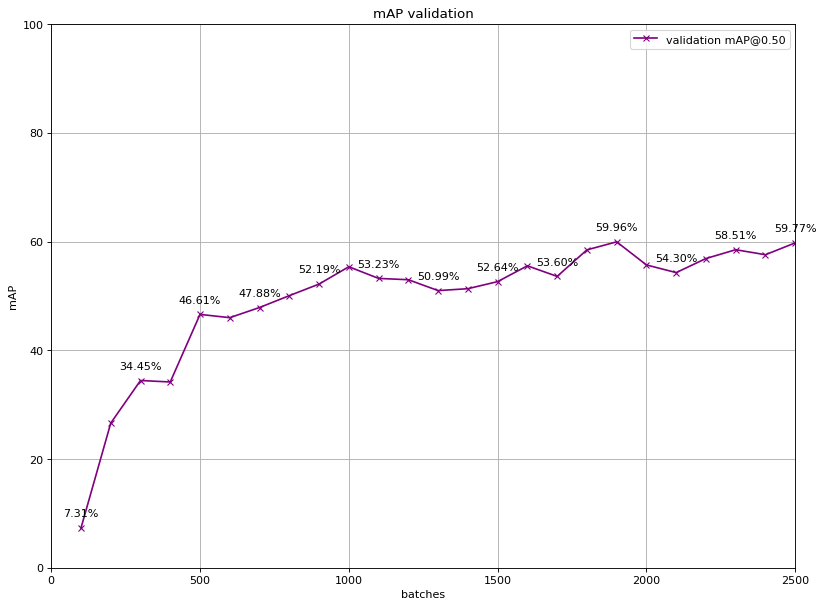

In [ ]:

fig = plt.figure(figsize=(12, 9), dpi=80)
ax = fig.add_subplot(1, 1, 1)
plt.plot(x,y, label = 'validation mAP@0.50',color ='purple',marker='x') # bar can be replaced by
plt.ylim(0.0,100.00) 
plt.xlim(0,2500)
ax.set_title('mAP validation')
ax.set_ylabel('mAP')
ax.set_xlabel('batches')
plt.legend(loc='best')
a = x[::2]
b = y[::2]
for i,j in zip(a,b):

    label = "{:.2f}".format(j)

    plt.annotate(label+'%', # this is the text
                 (i,j), # these are the coordinates to position the label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center')
plt.grid()
# scatter or line or even left as default
plt.savefig('Tiny YoloV4 mAP validation.png')
plt.show()

## Testing and evaluation

In [ ]:
weights_best = "/gdrive/MyDrive/Dataset_fire_detection/yolov4_tiny_logs/v2/yolov4-tiny_best.weights"
weights_best

cfg_file = '/gdrive/MyDrive/Dataset_fire_detection/cfg_files/yolov4-tiny.cfg'
cfg_file

'/gdrive/MyDrive/Dataset_fire_detection/cfg_files/yolov4-tiny.cfg'

In [ ]:
with open('/gdrive/MyDrive/Dataset_fire_detection/data/test.txt', 'r') as f:
    myTest = [line.strip() for line in f]

In [ ]:
test_im = '/gdrive/MyDrive/Dataset_fire_detection/data/Test/004_rgb.png'

In [ ]:
for c in range(len(myTest)):
  test_im = myTest[c]
  new_name = myTest[c].split('/')[-1]

  !./darknet detector test /gdrive/MyDrive/Dataset_fire_detection/obj_test.data  $cfg_file  $weights_best $test_im -ext_output

  print('Done predicting !')

  test_im = ''.join(test_im.split('\\'))
  src = '/gdrive/MyDrive/Dataset_fire_detection/darknet/predictions.jpg'
  file_name = '/gdrive/MyDrive/Dataset_fire_detection/darknet'

  new_name = test_im.split('/')[-1]
  new_src = os.path.join(file_name,new_name)

  file_dst = '/gdrive/MyDrive/Dataset_fire_detection/data/yolov4_tiny_results'
  dst = os.path.join(file_dst,new_name)
  print('')

  os.rename(src, new_src)
  print(f'renaming {src} ========> {new_src}')
  print('__________________')
  shutil.move(new_src, dst)
  print(f'moving from {new_src} =========> {dst}\n')
  print('__________________')
  print('__________________')



Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Done predicting !

renaming /gdrive/MyDrive/Dataset_fire_detection/darknet/predictions.jpg ========> /gdrive/MyDrive/Dataset_fire_detection/darknet/pic_101.jpg
__________________
moving from /gdrive/MyDrive/Dataset_fire_detection/darknet/pic_101.jpg =========> /gdrive/MyDrive/Dataset_fire_detection/data/yolov4_tiny_results/pic_101.jpg

__________________
__________________
 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 2    512 x 320 x   3 ->  256 x 160 x  32 0.071 BF
   1 conv     64       3 x 3/ 2    256 x 160 x  32 ->  128 x  80 x  64 0.377 BF
   2 conv     64

In [ ]:
!./darknet detector test /gdrive/MyDrive/Dataset_fire_detection/obj_test.data  $cfg_file  $weights_best $test_im -ext_output

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 2    512 x 320 x   3 ->  256 x 160 x  32 0.071 BF
   1 conv     64       3 x 3/ 2    256 x 160 x  32 ->  128 x  80 x  64 0.377 BF
   2 conv     64       3 x 3/ 1    128 x  80 x  64 ->  128 x  80 x  64 0.755 BF
   3 route  2 		                       1/2 ->  128 x  80 x  32 
   4 conv     32       3 x 3/ 1    128 x  80 x  32 ->  128 x  80 x  32 0.189 BF
   5 conv     32       3 x 3/ 1    128 x  80 x  32 ->  128 x  80 x  32 0.189 BF
   6 route  5 4 	                           ->  128 x  80 x  64 
   7 conv     64       1 x 1/ 1    128 x  80 x  64 ->  128 x  80 x  64 0.084 BF
   8 route  2 7 	    

In [ ]:
%ls

3rdparty/               DarknetConfig.cmake.in  net_cam_v4.sh
backup/                 darknet_images.py       obj/
bad.list                darknet.py              predictions.jpg
build/                  darknet_video.py        README.md
build.ps1               data/                   result.json
cfg/                    image_yolov3.sh         results/
chart.png               image_yolov4.sh         result.txt
chart_yolov3-tiny.png   include/                scripts/
cmake/                  json_mjpeg_streams.sh   src/
CMakeLists.txt          LICENSE                 vcpkg.json
counters_per_class.txt  Makefile                video_yolov3.sh
darknet*                net_cam_v3.sh           video_yolov4.sh


In [ ]:
!./darknet detector test /gdrive/MyDrive/Dataset_fire_detection/obj_test.data  $cfg_file  $weights_best '/gdrive/MyDrive/Dataset_fire_detection/data/Test/153_rgb.png' -ext_output


 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     16       3 x 3/ 1    512 x 320 x   3 ->  512 x 320 x  16 0.142 BF
   1 max                2x 2/ 2    512 x 320 x  16 ->  256 x 160 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    256 x 160 x  16 ->  256 x 160 x  32 0.377 BF
   3 max                2x 2/ 2    256 x 160 x  32 ->  128 x  80 x  32 0.001 BF
   4 conv     64       3 x 3/ 1    128 x  80 x  32 ->  128 x  80 x  64 0.377 BF
   5 max                2x 2/ 2    128 x  80 x  64 ->   64 x  40 x  64 0.001 BF
   6 conv    128       3 x 3/ 1     64 x  40 x  64 ->   64 x  40 x 128 0.377 BF
   7 max                2x 2/ 2     64 x  40 x 128 ->   32 x  20 x 128

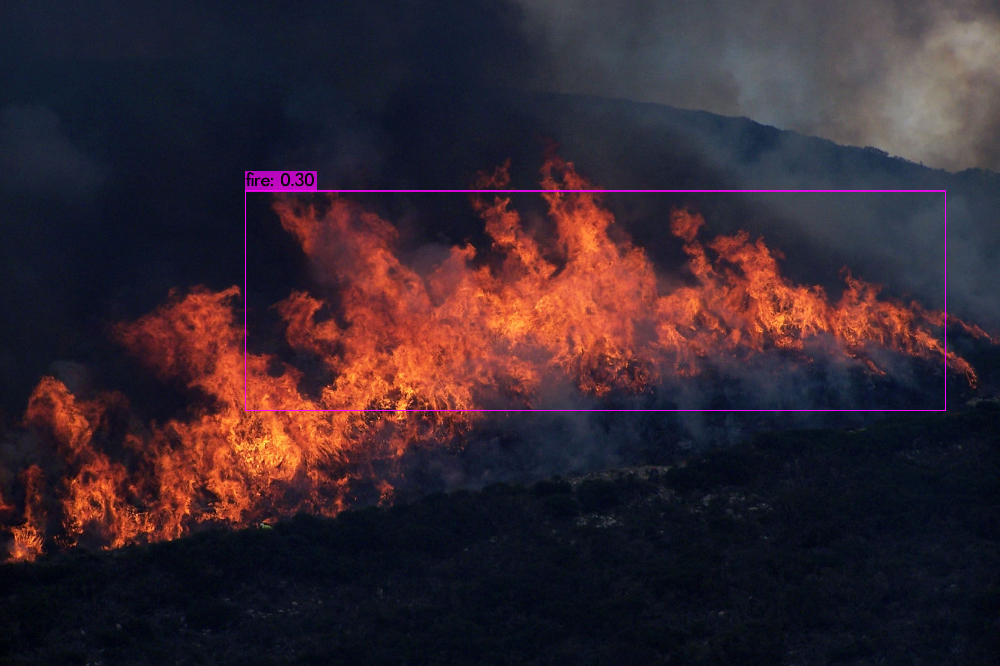

In [ ]:
img = cv2.imread("predictions.jpg")
cv2_imshow(img)

In [ ]:
#!./darknet detector test /gdrive/MyDrive/Dataset_fire_detection/obj_test.data  $cfg_file  $weights_best /gdrive/MyDrive/Dataset_fire_detection/data/Test/004_rgb.png -ext_output


 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     16       3 x 3/ 1    512 x 320 x   3 ->  512 x 320 x  16 0.142 BF
   1 max                2x 2/ 2    512 x 320 x  16 ->  256 x 160 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    256 x 160 x  16 ->  256 x 160 x  32 0.377 BF
   3 max                2x 2/ 2    256 x 160 x  32 ->  128 x  80 x  32 0.001 BF
   4 conv     64       3 x 3/ 1    128 x  80 x  32 ->  128 x  80 x  64 0.377 BF
   5 max                2x 2/ 2    128 x  80 x  64 ->   64 x  40 x  64 0.001 BF
   6 conv    128       3 x 3/ 1     64 x  40 x  64 ->   64 x  40 x 128 0.377 BF
   7 max                2x 2/ 2     64 x  40 x 128 ->   32 x  20 x 128

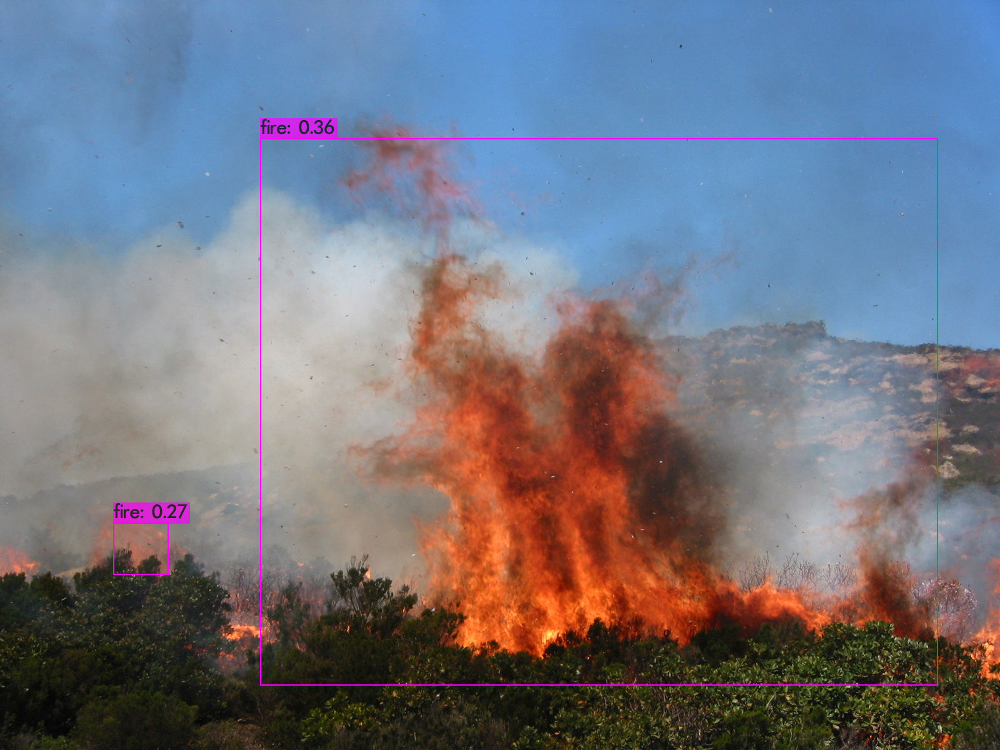

In [ ]:
img = cv2.imread("predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector map /gdrive/MyDrive/Dataset_fire_detection/obj_test.data $cfg_file $weights_best -points 0

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     16       3 x 3/ 1    512 x 320 x   3 ->  512 x 320 x  16 0.142 BF
   1 max                2x 2/ 2    512 x 320 x  16 ->  256 x 160 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    256 x 160 x  16 ->  256 x 160 x  32 0.377 BF
   3 max                2x 2/ 2    256 x 160 x  32 ->  128 x  80 x  32 0.001 BF
   4 conv     64       3 x 3/ 1    128 x  80 x  32 ->  128 x  80 x  64 0.377 BF
   5 max                2x 2/ 2    128 x  80 x  64 ->   64 x  40 x  64 0.001 BF
   6 conv    128       3 x 3/ 1     64 x  40 x  64 ->   64 x  40 x 128 0.377 BF
   7 max                2x 2/ 2     64 x  40 x 128 ->   32 x  20 x 128

In [ ]:
%ls

3rdparty/               DarknetConfig.cmake.in  net_cam_v4.sh
backup/                 darknet_images.py       obj/
bad.list                darknet.py              predictions.jpg
build/                  darknet_video.py        README.md
build.ps1               data/                   results/
cfg/                    image_yolov3.sh         result.txt
chart.png               image_yolov4.sh         scripts/
chart_yolov3-tiny.png   include/                src/
cmake/                  json_mjpeg_streams.sh   vcpkg.json
CMakeLists.txt          LICENSE                 video_yolov3.sh
counters_per_class.txt  Makefile                video_yolov4.sh
darknet                 net_cam_v3.sh


In [ ]:
#with open('/gdrive/MyDrive/Dataset_fire_detection/data/test.txt', 'r') as f:
#    myTest = [line.strip() for line in f]
#myTest[0].split('/')[-1]

In [ ]:
"""c = 0

import subprocess

for test_im in myTest :
  c += 1
  src = '/gdrive/MyDrive/Dataset_fire_detection/darknet/predictions.jpg'
  file_name = '/gdrive/MyDrive/Dataset_fire_detection/darknet'
  new_name = test_im.split('/')[-1]
  new_src = os.path.join(file_name,new_name)
  file_dst = '/gdrive/MyDrive/Dataset_fire_detection/data/yolov4_tiny_v1_results'
  dst = os.path.join(file_dst,new_name)
  cmd_stuff = test_im +' -ext_output'
  cmd_first_part = './darknet detector test /gdrive/MyDrive/Dataset_fire_detection/obj_test.data  $cfg_file  $weights_best '
  cmd = cmd_first_part + cmd_stuff
  print(cmd)
  
  print('\n')
  

  #os.rename(src, new_src)
  print(f'renaming {src} ========> {new_src}')

  #shutil.move(new_src, dst)
  print(f'moving from {new_src} =========> {dst}')
  
  print('done lmao !')
  if c == 5 :
    break"""

In [ ]:
import subprocess
subprocess.run("!cd ..",shell =True)

CompletedProcess(args='!cd ..', returncode=127)

## resize